<a href="https://colab.research.google.com/github/basab1142/Dog_vision/blob/main/DOG_CLASSIFICATION.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# End-to-end multiclass Dog Breed Classification

This notebook builds a multiclass image classifier with help of tensorflow 2.0
& Tensorflow Hub



## 1. problem

Classifying a dog from  image
## 2. Data 
Data is from kaggle's competition
link:https://www.kaggle.com/c/dog-breed-identification/data
## 3. Evaluation
The evaluation is a file with prediction probabilities for each dog breed of each test image
https://www.kaggle.com/competitions/dog-breed-identification/overview
## Features

* There are 120 images of dog in our unstructured data
so will use deep learning
* There around 10,000 + images in the training set with labels
* There around 10,000 + images in the test set without labels


In [ ]:
# unzip the zip file
#!unzip "/content/drive/MyDrive/dog-breed-identification.zip" -d "/content/drive/MyDrive/"

### Getting our tools ready

In [ ]:
# import TensorFlow
import tensorflow as tf
print(" TF Version: ",tf.__version__)

 TF Version:  2.8.2


### It's Atri

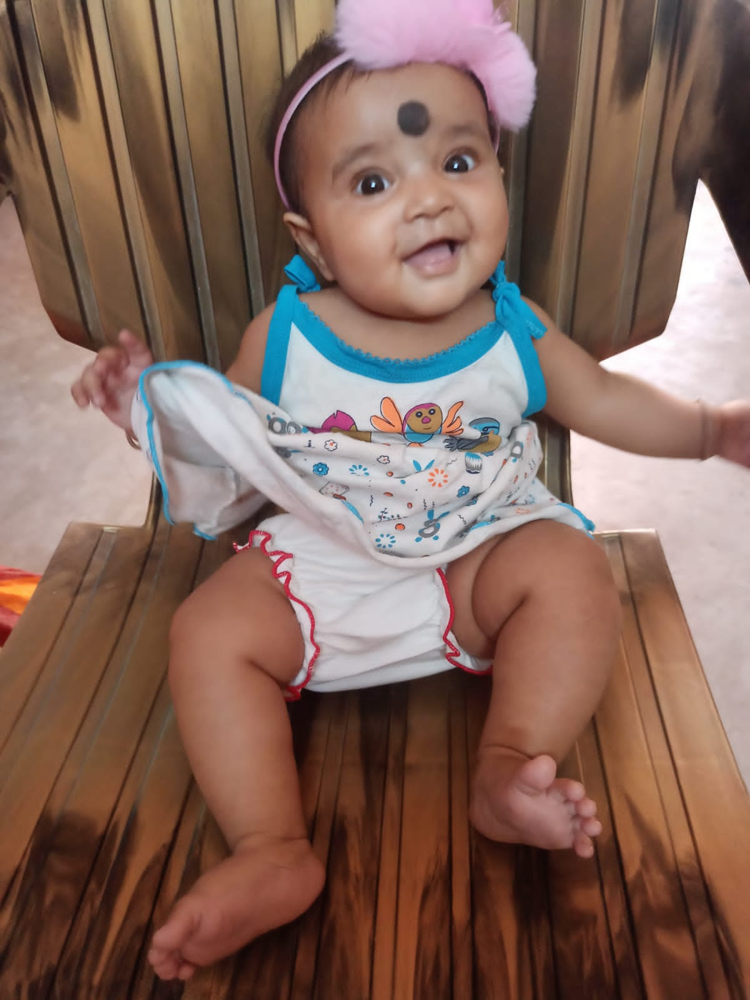

### Get our workspace ready
* Import Tensorflow 2.x.y
* Import Tensorflow Hub
* Make sure we're using a GPU

In [ ]:
import tensorflow_hub as hub
print("Tensorflow hub version :", hub.__version__)


## Check for GPU availability
print("GPU","available" if tf.config.list_physical_devices("GPU") else "not available")

Tensorflow hub version : 0.12.0
GPU available


## Getting our data ready( Turning them into tensors a.k.a numpy array)

With all machhine Learning models , our data has to be in numerical format. So that's what we'll be doing first.Turning our images to tensors

In [5]:
import pandas as pd
label_csv= pd.read_csv("/content/drive/MyDrive/labels.csv")
label_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


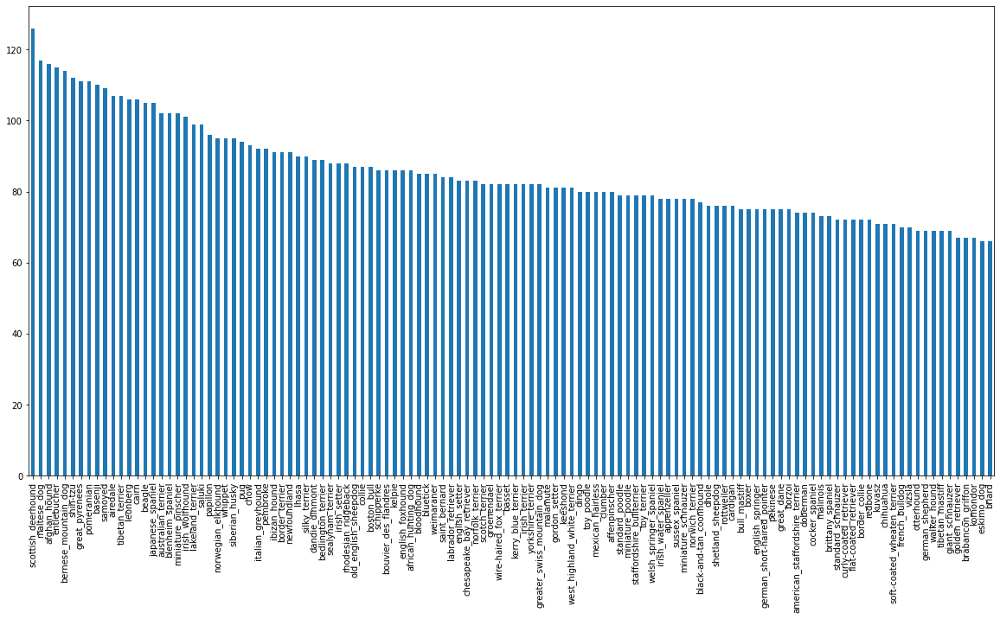

In [6]:
### How many images are there per class
label_csv["breed"].value_counts().plot.bar(figsize=(20,10));

In [7]:
label_csv["breed"].value_counts().mean()

85.18333333333334

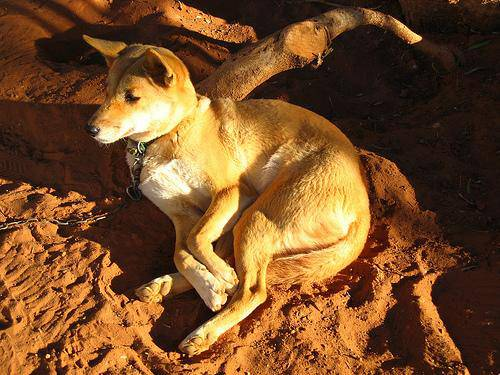

In [8]:
# let's view an image
from IPython.display import Image
Image("/content/drive/MyDrive/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting images and their labels

Let's get a list of all of our image file pathnames

In [9]:
label_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [10]:
## Create pathnames from image ID's
filenames=["/content/drive/MyDrive/train/" + fname + ".jpg" for fname in label_csv["id"]]
filenames[:10]


['/content/drive/MyDrive/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [11]:
## check whether number file name is matches with actual file 

## They have to be same
len(filenames),len(label_csv)

(10222, 10222)

In [12]:
import os
if len(os.listdir("/content/drive/MyDrive/train"))==len(filenames):
  print("File are of exact same number")
else:
  print("\n Not the same")  

File are of exact same number


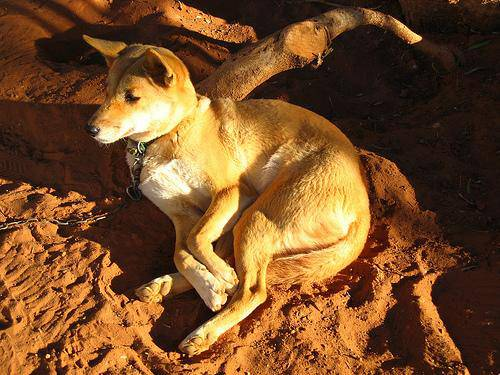

In [13]:
## one more check
Image('/content/drive/MyDrive/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg')

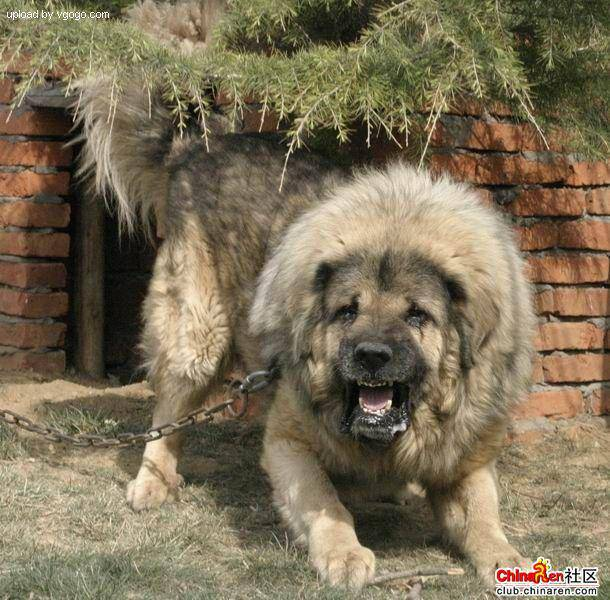

In [14]:
Image(filenames[9000])

Since we've now got our training image filepaths in alist, let's prepare our labels

In [15]:
import numpy as np

labels=label_csv["breed"]
labels=np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [16]:
len(labels)

10222

In [17]:
# see if number of label matches with number filenames
if len(labels)==len(filenames):
  print("\n Yes matched")
else:
  print("No0oooo ")  


 Yes matched


In [18]:
len(label_csv["breed"].unique())

120

In [19]:
unique_breeds=np.unique(labels)

In [ ]:
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
print(labels[0])
labels[0]== unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
 # Turn every label into boolean array
boolean_labels=[label== unique_breeds for label in labels]

In [ ]:
boolean_labels[:3]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
# Example turning boolean array into integers
print(labels[0])
print(np.where(unique_breeds==labels[0]))  # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the same label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
# Example turning boolean array into integers
print(labels[1])
print(np.where(unique_breeds==labels[1]))  # indexwhere label occurs
print(boolean_labels[1].argmax())
print(boolean_labels[1].astype(int)) # there will be a 1 where the same label occurs
print(boolean_labels[1].sum())

dingo
(array([37]),)
37
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]
1


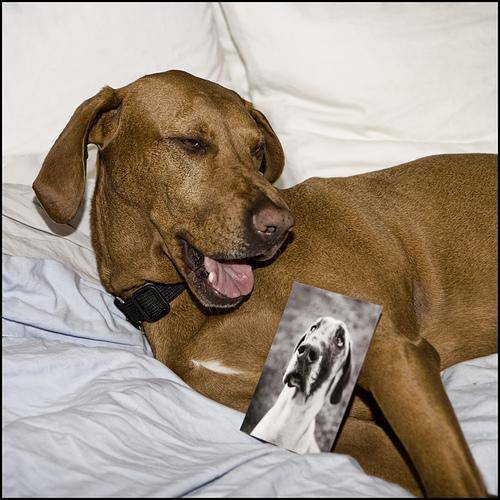

In [ ]:
Image(filenames[100])

In [ ]:
## Filenames are still of string type
boolean_labels[2].astype(int)

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0])

### Creating our own validation set
Since the Dataset fromKaggle doesn't come with a validation set We have to create our own

In [ ]:
# Set up X and y variables
x= filenames
y= boolean_labels

In [ ]:
len(filenames),len(y)

(10222, 10222)

 We are going to start off experimenting with ~ 1000 images and increase as needed

In [ ]:
# Set number of images to use for experimenting
# In deep learning as convention we use capital to indicate that we can change that parameter(hyperparameter)
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max: 10000, step:100}

In [ ]:
## Let's split our Data in Train and validation
from sklearn.model_selection import train_test_split

## Split them into training and validation of total size NUM_IMAGES
x_train,x_val,y_train,y_val= train_test_split(x[:NUM_IMAGES],y[:NUM_IMAGES],test_size=0.2,random_state= 9)
len(x_train),len(y_train),len(x_val),len(y_val)

(800, 800, 200, 200)

In [ ]:
x_train[:5],y[:2]

(['/content/drive/MyDrive/train/182c436dd1fbec1c5f4979077ce74659.jpg',
  '/content/drive/MyDrive/train/145f7bb3bf6e4877b8b6624f612a1c24.jpg',
  '/content/drive/MyDrive/train/0f91ba06bfea7401f59c6d796717029d.jpg',
  '/content/drive/MyDrive/train/02508e76981e1ba059d785704b4c480c.jpg',
  '/content/drive/MyDrive/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False,  True, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, Fal

###  Preprocessing Images ( Turning images into Tensors)

to preprocess our images into tensors we're going to write a function which does a few things:

1. take an Image Filepath as input
2. Use tensorflow to read the file and save to the variable.`image`
3. turn our `image` (a jpg) into tensors
4. Resize the `image` to be a shape of (224,224)

In [ ]:
## Convert an image into numpy array
from matplotlib.pyplot import imread
image = imread(filenames[42]) 
image.shape, image

((257, 350, 3), array([[[ 89, 137,  87],
         [ 76, 124,  74],
         [ 63, 111,  59],
         ...,
         [ 76, 134,  86],
         [ 76, 134,  86],
         [ 76, 134,  86]],
 
        [[ 72, 119,  73],
         [ 67, 114,  68],
         [ 63, 111,  63],
         ...,
         [ 75, 131,  84],
         [ 74, 132,  84],
         [ 74, 131,  86]],
 
        [[ 56, 104,  66],
         [ 58, 106,  66],
         [ 64, 112,  72],
         ...,
         [ 71, 127,  82],
         [ 73, 129,  84],
         [ 73, 130,  85]],
 
        ...,
 
        [[  2,  11,  10],
         [  5,  14,  13],
         [  6,  15,  14],
         ...,
         [120, 113,  67],
         [126, 118,  72],
         [122, 114,  67]],
 
        [[  0,   4,   6],
         [  0,   9,   8],
         [  1,  10,   9],
         ...,
         [105,  98,  52],
         [111, 104,  58],
         [111, 103,  56]],
 
        [[ 18,  16,  37],
         [ 18,  18,  28],
         [ 17,  20,  11],
         ...,
         [101

In [ ]:
## turn image into NumPy array
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

## Building a function which does below mentioned things:
1. take an Image Filepath as input
2. Use tensorflow to read the file and save to the variable.`image`
3. turn our `image` (a jpg) into tensors
4. Normalize our image by converting it into 0-1
4. Resize the `image` to be a shape of (224,224)

In [ ]:
## Define image size
IMG_SIZE = 224

## Create a function to preprocess an image
def procees_image(image_path):
  """
  Takes an image path and modify them into shape(224,224) and turn them into tensors
  """
  # Read in an image file
  image= tf.io.read_file(image_path)

  ## Turn jpeg image into tensor with 3 color channel
  image= tf.image.decode_jpeg(image,channels=3)
  
  ## Convert color  channel values that are of 0-255 to 0-1
  image= tf.image.convert_image_dtype(image,tf.float32)
  ## resize the image
  image= tf.image.resize(image,size=[IMG_SIZE,IMG_SIZE])
  return image



In [ ]:
### just verifying 
bas= procees_image(filenames[6])
bas

<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
array([[[0.23391497, 0.29333374, 0.33678612],
        [0.01695835, 0.02126523, 0.10267279],
        [0.01647815, 0.02950337, 0.00205238],
        ...,
        [0.16885506, 0.09956634, 0.07013503],
        [0.1401961 , 0.07687315, 0.05511212],
        [0.09911472, 0.04029118, 0.02068333]],

       [[0.23797268, 0.29739144, 0.3313785 ],
        [0.02328432, 0.02881622, 0.10413166],
        [0.02870539, 0.03706155, 0.0119451 ],
        ...,
        [0.08993351, 0.03130864, 0.00553221],
        [0.08256364, 0.02923702, 0.00453449],
        [0.07875241, 0.02777201, 0.0042426 ]],

       [[0.23748656, 0.30705735, 0.32662407],
        [0.01995799, 0.03364924, 0.09396619],
        [0.02510785, 0.03060506, 0.0077059 ],
        ...,
        [0.08141778, 0.03474862, 0.        ],
        [0.10141812, 0.05043772, 0.02194856],
        [0.10724796, 0.05626756, 0.03273815]],

       ...,

       [[0.03124809, 0.09007163, 0.07046378],
        [0.03

In [ ]:
## Checking the function
tensor = tf.io.read_file(filenames[45])
tensor

<tf.Tensor: shape=(), dtype=string, numpy=b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xdb\x00C\x00\n\x07\x07\x08\x07\x06\n\x08\x08\x08\x0b\n\n\x0b\x0e\x18\x10\x0e\r\r\x0e\x1d\x15\x16\x11\x18#\x1f%$"\x1f"!&+7/&)4)!"0A149;>>>%.DIC<H7=>;\xff\xdb\x00C\x01\n\x0b\x0b\x0e\r\x0e\x1c\x10\x10\x1c;("(;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;\xff\xc0\x00\x11\x08\x01w\x01\xf4\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1f\x00\x00\x01\x05\x01\x01\x01\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x01\x02\x03\x04\x05\x06\x07\x08\t\n\x0b\xff\xc4\x00\xb5\x10\x00\x02\x01\x03\x03\x02\x04\x03\x05\x05\x04\x04\x00\x00\x01}\x01\x02\x03\x00\x04\x11\x05\x12!1A\x06\x13Qa\x07"q\x142\x81\x91\xa1\x08#B\xb1\xc1\x15R\xd1\xf0$3br\x82\t\n\x16\x17\x18\x19\x1a%&\'()*456789:CDEFGHIJSTUVWXYZcdefghijstuvwxyz\x83\x84\x85\x86\x87\x88\x89\x8a\x92\x93\x94\x95\x96\x97\x98\x99\x9a\xa2\xa3\xa4\xa5\xa6\xa7\xa8\xa9\xaa\xb2\xb3\xb4\xb5\xb6\xb7\xb8\xb9\xba\xc2\xc3\xc4\xc5\xc6\xc7\xc8\xc9\xca

In [ ]:
tensor=tf.image.decode_jpeg(tensor,channels=3)
tensor

<tf.Tensor: shape=(375, 500, 3), dtype=uint8, numpy=
array([[[85, 66, 60],
        [86, 67, 61],
        [84, 65, 59],
        ...,
        [39, 25, 22],
        [46, 32, 29],
        [50, 36, 33]],

       [[85, 66, 60],
        [89, 70, 64],
        [88, 69, 63],
        ...,
        [49, 35, 32],
        [56, 42, 39],
        [60, 46, 43]],

       [[90, 71, 65],
        [96, 77, 71],
        [95, 76, 70],
        ...,
        [58, 44, 41],
        [65, 51, 48],
        [68, 54, 51]],

       ...,

       [[43, 29, 18],
        [46, 32, 21],
        [44, 30, 19],
        ...,
        [53, 41, 29],
        [53, 41, 29],
        [53, 41, 29]],

       [[39, 25, 14],
        [43, 29, 18],
        [43, 29, 18],
        ...,
        [54, 42, 30],
        [54, 42, 30],
        [54, 42, 30]],

       [[35, 21, 10],
        [40, 26, 15],
        [43, 29, 18],
        ...,
        [55, 43, 31],
        [55, 43, 31],
        [55, 43, 31]]], dtype=uint8)>

In [ ]:
tensor= tf.image.convert_image_dtype(tensor,tf.float32)
tensor

<tf.Tensor: shape=(375, 500, 3), dtype=float32, numpy=
array([[[0.33333334, 0.25882354, 0.23529413],
        [0.3372549 , 0.2627451 , 0.2392157 ],
        [0.32941177, 0.25490198, 0.23137257],
        ...,
        [0.15294118, 0.09803922, 0.08627451],
        [0.18039216, 0.1254902 , 0.1137255 ],
        [0.19607845, 0.14117648, 0.12941177]],

       [[0.33333334, 0.25882354, 0.23529413],
        [0.34901962, 0.27450982, 0.2509804 ],
        [0.34509805, 0.27058825, 0.24705884],
        ...,
        [0.19215688, 0.13725491, 0.1254902 ],
        [0.21960786, 0.16470589, 0.15294118],
        [0.23529413, 0.18039216, 0.16862746]],

       [[0.3529412 , 0.2784314 , 0.25490198],
        [0.37647063, 0.3019608 , 0.2784314 ],
        [0.37254903, 0.29803923, 0.27450982],
        ...,
        [0.227451  , 0.17254902, 0.16078432],
        [0.25490198, 0.20000002, 0.18823531],
        [0.26666668, 0.21176472, 0.20000002]],

       ...,

       [[0.16862746, 0.1137255 , 0.07058824],
        [0.18

In [ ]:
tf.image.resize(tensor,size=[44,44])

<tf.Tensor: shape=(44, 44, 3), dtype=float32, numpy=
array([[[0.35693163, 0.28242183, 0.2559067 ],
        [0.30515313, 0.24626477, 0.21368901],
        [0.42641795, 0.36260736, 0.33181414],
        ...,
        [0.22768903, 0.15317921, 0.12572823],
        [0.28477615, 0.22314514, 0.21231626],
        [0.18957596, 0.1498417 , 0.13245392]],

       [[0.42175505, 0.35116678, 0.29626483],
        [0.43531442, 0.3647262 , 0.3098242 ],
        [0.4245625 , 0.35142198, 0.29652002],
        ...,
        [0.37373742, 0.2992276 , 0.27177662],
        [0.14099795, 0.09786069, 0.08217441],
        [0.20499529, 0.13928068, 0.12981299]],

       [[0.43400183, 0.36341357, 0.3085116 ],
        [0.43076894, 0.35839814, 0.30349618],
        [0.44748828, 0.40042946, 0.33768433],
        ...,
        [0.15734492, 0.09174746, 0.06001851],
        [0.2295335 , 0.15502368, 0.1275727 ],
        [0.16297595, 0.11385507, 0.07794111]],

       ...,

       [[0.16573086, 0.11475048, 0.07945636],
        [0.2030

## Turning our Data into numbers

Why turn our Data into batches?

Let's say you're trying to process 10k++ images in one go
they all might not fit into the memory

>> So that's why we need batch size of about 32

( We can manually adjust the batch )

In order to use TensorFlow effectively , we need our Data in the form of Tensor tuples which look like this:
`(image , label)`

In [ ]:
## Create a function that return tuple of the tensors(image , label)
def get_image_label(image_path,label):
  """
  Create a function that return tuple of the tensors(image , label)
  """
  return procees_image(image_path),label

In [ ]:
get_image_label(filenames[34],tf.constant(boolean_labels[34]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.09042301, 0.10218772, 0.12179556],
         [0.11473363, 0.12649834, 0.14610618],
         [0.09272581, 0.10449051, 0.12409835],
         ...,
         [0.8196079 , 0.79215693, 0.7294118 ],
         [0.8136382 , 0.78618723, 0.7234421 ],
         [0.80392164, 0.77647066, 0.7137255 ]],
 
        [[0.08168886, 0.09737513, 0.10913984],
         [0.09317888, 0.10886515, 0.12062985],
         [0.1127224 , 0.12840867, 0.14017338],
         ...,
         [0.8196079 , 0.79215693, 0.7294118 ],
         [0.8136382 , 0.78618723, 0.7234421 ],
         [0.80480576, 0.7773548 , 0.7146096 ]],
 
        [[0.1778584 , 0.19354467, 0.20530938],
         [0.10785257, 0.12353884, 0.13530354],
         [0.17694902, 0.1926353 , 0.2044    ],
         ...,
         [0.8196079 , 0.79215693, 0.7294118 ],
         [0.8136382 , 0.78618723, 0.7234421 ],
         [0.8078432 , 0.7803922 , 0.7176471 ]],
 
        ...,
 
        [[0.14830667, 0.16399294

Now we've got a way to turn our Data into tuples of Tensors in the form of image label :: `(image,label)`.  Let's make a function to turn all our Data (X & y) into batches 


In [ ]:
### Define a Batch size
BATCH_SIZE=32

# Create a function to turn data into batches
def create_data_batches(x,y=None,batch_size=BATCH_SIZE , valid_data = False, test_data= False):
  """
  This function creates batches out image (x) and labels(y) pairs...
  for training data it shuffles the Data 
  """
  ## if the Data is a test dataset , we probably don't have labels
  if test_data:
    print("Creating Batches for test_data")
    data= tf.data.Dataset.from_tensor_slices(tf.constant(x))
    data_batches =data.map(procees_image).batch(BATCH_SIZE)
    return data_batches
    ## if the data is validation set
  elif valid_data:
    print("Creating Batches for valid_data")
    data= tf.data.Dataset.from_tensor_slices((tf.constant(x),tf.constant(y)))
    data_batches =data.map(get_image_label).batch(BATCH_SIZE)
    return data_batches
  else:
    print("Creating Batches for train_data")
    ## Turning file pathnames and labels into tensor
    data= tf.data.Dataset.from_tensor_slices((tf.constant(x),tf.constant(y)))
    ## shuffling pathnames and labels
    data= data.shuffle(buffer_size=len(x))
    data_batches = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batches




In [ ]:
# Creating train set
train_data= create_data_batches(x=x_train,y=y_train)

Creating Batches for train_data


In [ ]:
# Crating Validation set
val_data= create_data_batches(x=x_val,y=y_val,valid_data=True)

Creating Batches for valid_data


In [ ]:
train_data.element_spec,val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualization of Data

>> Our Data is now in batches, however , these can be little hard to understand . Let's visualise by building a function

In [ ]:
import matplotlib.pyplot as plt

def create_image(images,labels):
  """
  Docstring: Displays plot of  25 images and their label from Data batch
  """

  ## Setup the fugure
  plt.figure(figsize=(20,15))
  ## Lop through 25 mages( For displaying 25 Images)
  for i in range(0,25):
    # Create subplots
    ax=plt.subplot(5,5,i+1)
    # Display an Image
    plt.imshow(images[i])
    ## Add image label as title
    plt.title(unique_breeds[labels[i].argmax()])
    plt.axis("off")

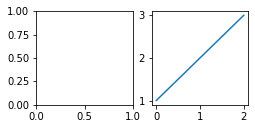

In [ ]:

## Demo for the function
%matplotlib inline
plt.figure(figsize=(10,10))
ax=plt.subplot(5,5,2)
ax.plot([1,2,3])
ax2=plt.subplot(5,5,1)


In [ ]:
train_images,train_labels = next(train_data.as_numpy_iterator())
train_images,train_labels

(array([[[[4.81206954e-01, 5.40030479e-01, 2.85128504e-01],
          [4.79543090e-01, 5.41176498e-01, 2.88432091e-01],
          [4.71463621e-01, 5.36201000e-01, 2.88965374e-01],
          ...,
          [3.86362150e-02, 2.68715099e-02, 5.73000032e-03],
          [5.50375171e-02, 4.10823375e-02, 2.58554406e-02],
          [4.77780886e-02, 3.20918113e-02, 2.85887662e-02]],
 
         [[4.77636933e-01, 5.44303596e-01, 2.70984262e-01],
          [4.72295195e-01, 5.38961828e-01, 2.70409286e-01],
          [4.62296903e-01, 5.30007005e-01, 2.66533583e-01],
          ...,
          [8.38234052e-02, 8.71497467e-02, 5.57771921e-02],
          [4.10227701e-02, 4.37538661e-02, 2.09884271e-02],
          [5.71009591e-02, 5.98320551e-02, 3.74931134e-02]],
 
         [[4.59851235e-01, 5.38912833e-01, 2.56244779e-01],
          [4.42627788e-01, 5.21689415e-01, 2.41831198e-01],
          [4.30873632e-01, 5.09874046e-01, 2.32711837e-01],
          ...,
          [8.63619521e-02, 1.13173865e-01, 8.3009

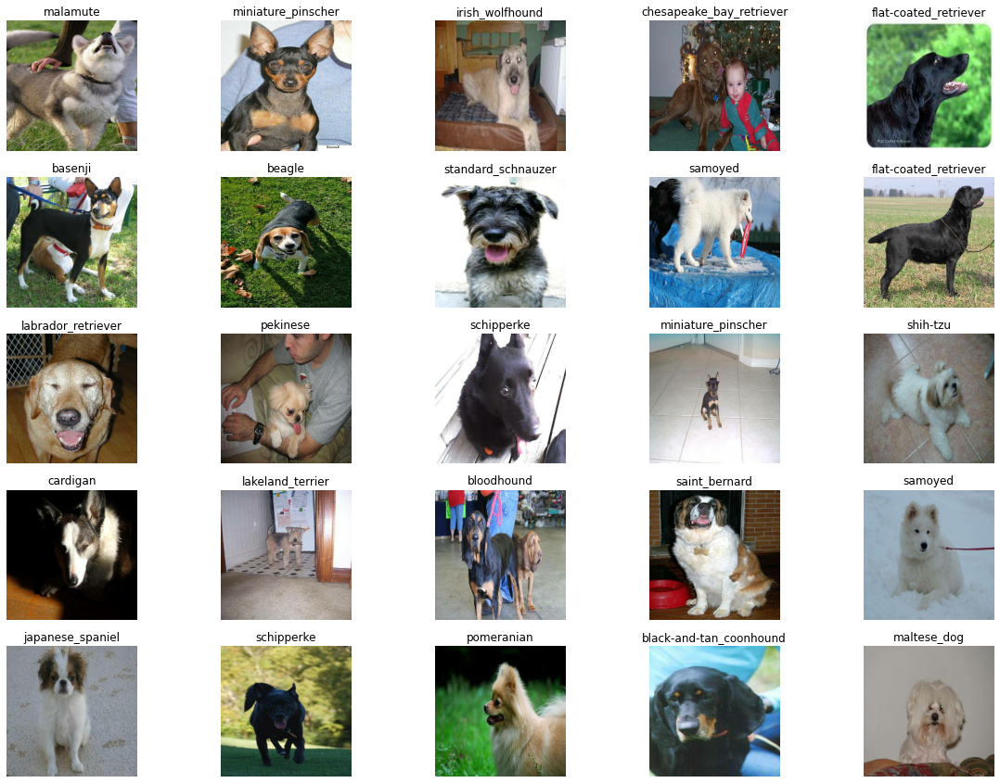

In [ ]:
## Now let's visualise our data on trainig batch
create_image(train_images,train_labels)

In [ ]:
valid_images,valid_labels = next(val_data.as_numpy_iterator())

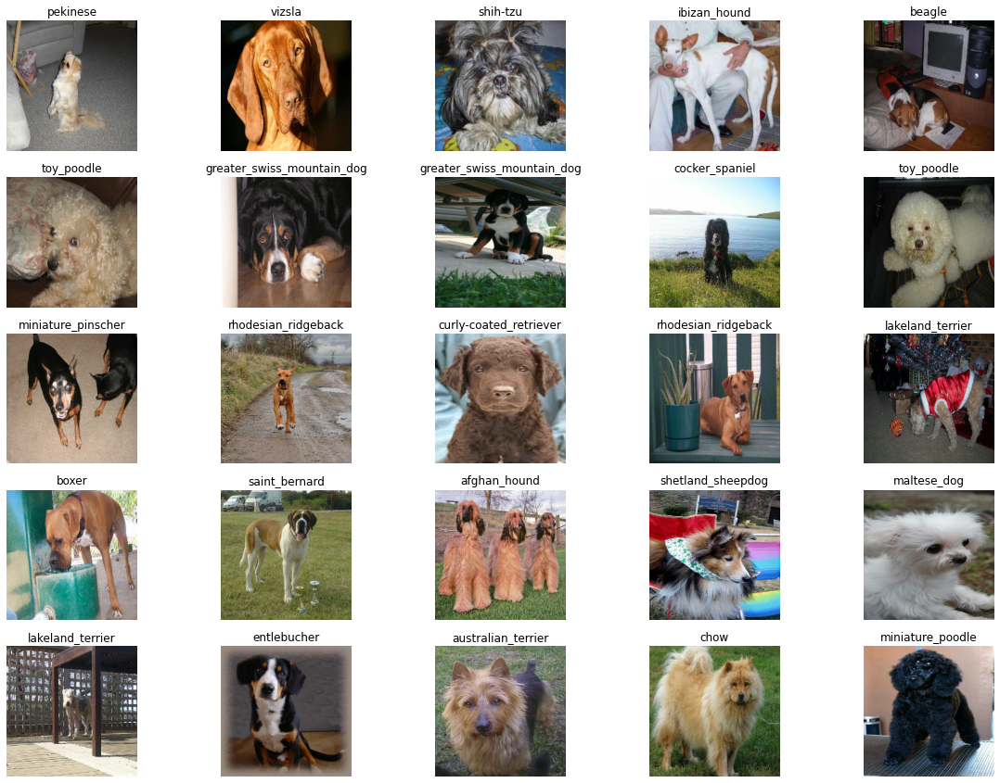

In [ ]:
create_image(valid_images,valid_labels)

In [ ]:
train_labels[1]

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False,  True, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

## Building a Model

Before we build a model, there are few things we need to define:

* The input shape (our images shape, in the form of tensors) to our model.
* The output shape (Image Label, in the form of tensors) of our model
* The URL of our model we want to use From TensorFlow Hub https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [ ]:
## Set up input shape to the model
INPUT_SHAPE= [None, IMG_SIZE,IMG_SIZE,3]  # Batch ,height , width , color channel

# Setup the outshape of our outlabel
OUTPUT_SHAPE =len(unique_breeds)

# Set up model URL from TENSORFLOW HUB
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

We have got our input and output shape ready and a model
Now create keras deep learning model

Making a Function
* Takes the input and output size and model we have chosen as param
* Defines the layers in keras model in sequential fashion.
* compiles the model
* Bulids the model (Tells about input size)
* Returns model

In [ ]:
from tensorflow.python.eager.monitoring import Metric
def create_model(input_shape= INPUT_SHAPE,output_shape= OUTPUT_SHAPE,model_url= MODEL_URL):
  ## to check which model it is
  print(" Building model with url",model_url)
  ## Setting up the model layer
  model= tf.keras.Sequential([
                              hub.KerasLayer(model_url),# input layer
                              tf.keras.layers.Dense(units= output_shape, ## output layer
                                                    activation="softmax")
  ])

  ## Compile the model
  model.compile(
      loss= tf.keras.losses.CategoricalCrossentropy(),
      optimizer= tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )
  ## Build the model
  model.build(input_shape) # Batch input size

  return model


In [ ]:
model=create_model()

model.summary()

 Building model with url https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Creating callbacks
Callbacks are helper functions a model can use during training to do such things as save its progress, checkits progress or stop training early if the model stops improving etc.

>> A callback is a powerful tool to customize the behavior of a Keras model during training, evaluation, or inference. Examples include tf.keras.callbacks.TensorBoard to visualize training progress and results with TensorBoard, or tf.keras.callbacks.ModelCheckpoint to periodically save your model during training.
https://www.tensorflow.org/guide/keras/custom_callback

*We will create two callbacks, one for the TensorBoard which helps track our model progress & another for early stopping which prevents our model from training for too long*

### Tensorboard callback
To set up a tensor boardcallBack we need to do three things:

1. Load the tensorboard notebook extension
2. Create a Tensorboard callBack which is able to save logs to a directory and pass it to our model's `fit` function.
3. Visualize our models training logs with `%tensorboard` magic function

In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
## Step 2
import datetime

## Create function to build a  TensorBoard callBack
def create_tensorboard_callback():
  # Create a log directory for storing tensor board logs
  logdir= os.path.join("/content/drive/MyDrive/logs", # make it so that the logs get tracked whenever we run an experiment
                       datetime.datetime.now().strftime("%S%M%H-- %Y%m%d"))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early Stopping Callbacks
https://keras.io/api/callbacks/early_stopping/

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping


Stop training when a monitored metric has stopped improving.

In [ ]:
## create_early_stopping_callbacks
early_stopping=tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                patience=3)

## Training a model ( on a subset of the data)

Our first model is only going to train on 1000 images to make sure everything is working.

In [ ]:
NUM_EPOCHS=100 #@param {type:"slider",min:10,max:100,step:10}

In [ ]:
# make sure we are still running on GPU
print("GPU","available" if tf.config.list_physical_devices("GPU") else "not availabel")

GPU available


Let's create a function which trains a model.

* Create a model using `create_model()`
* Setup a TensorBoard CallBackusing `create_tensorboard_callback()` function
* call the `fit` function on our model passing it the traiong data, validation data, number of epochs to train for(`NUM_EPOCHS`) and the callbacks we'd like to use
* Reurn the model

In [ ]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains agiven model and returns the trained version.
  """
  # Create a model
  model=create_model()
  #create new tensorboard session everytime we train a model
  tensorboard= create_tensorboard_callback()

  # Fit te model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data= val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  ## Return model
  return model

In [ ]:
# Fit the model to the data
%%time
model= train_model()

 Building model with url https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 22s 169ms/step - loss: 4.6603 - accuracy: 0.0838 - val_loss: 3.5407 - val_accuracy: 0.2250
Epoch 2/100
25/25 [==============================] - 3s 127ms/step - loss: 1.6794 - accuracy: 0.6775 - val_loss: 2.1755 - val_accuracy: 0.5200
Epoch 3/100
25/25 [==============================] - 3s 132ms/step - loss: 0.5728 - accuracy: 0.9450 - val_loss: 1.7271 - val_accuracy: 0.5950
Epoch 4/100
25/25 [==============================] - 3s 130ms/step - loss: 0.2484 - accuracy: 0.9925 - val_loss: 1.5788 - val_accuracy: 0.6150
Epoch 5/100
25/25 [==============================] - 4s 155ms/step - loss: 0.1421 - accuracy: 0.9987 - val_loss: 1.5161 - val_accuracy: 0.6250
Epoch 6/100
25/25 [==============================] - 3s 128ms/step - loss: 0.0975 - accuracy: 1.0000 - val_loss: 1.4698 - val_accuracy: 0.6300
Epoch 7/100
25/25 [=========================

**NOTE**  *Over Fitting is good at the beginning as it indicates that our model is learning*

#### Checking the tensorboard logs
The tensorboard magic function will access the logs the directory we created earlier and visualize its content

In [ ]:
%tensorboard --logdir /content/drive/MyDrive/logs

<IPython.core.display.Javascript object>

### Making and evaluating a predictions using a trained model


In [ ]:
# Make prediction on the validation data( not used to train on)
predictions =model.predict(val_data,
                           verbose=1)
predictions

7/7 [==============================] - 1s 98ms/step


array([[1.62307639e-02, 5.95516479e-03, 5.02647435e-06, ...,
        3.13280179e-05, 8.38471897e-06, 2.00572088e-02],
       [5.11365470e-05, 7.26588260e-05, 3.71861679e-05, ...,
        1.34909875e-04, 4.80756426e-05, 1.06418564e-03],
       [4.12719743e-03, 1.04844978e-03, 1.29035281e-04, ...,
        7.60286866e-06, 1.03903192e-04, 4.36083227e-03],
       ...,
       [7.83691090e-03, 5.57365536e-04, 3.84750398e-04, ...,
        5.36950771e-03, 7.87023280e-04, 1.11209728e-01],
       [1.43313824e-04, 6.45783075e-05, 3.09213974e-05, ...,
        1.15042340e-05, 9.80383847e-05, 2.05939388e-04],
       [1.02750255e-05, 5.84140480e-06, 4.69397601e-05, ...,
        5.27148950e-06, 1.36345170e-05, 8.75423138e-04]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
predictions[1]

array([5.11365470e-05, 7.26588260e-05, 3.71861679e-05, 2.51331221e-04,
       1.15208374e-03, 4.10007087e-05, 7.40240212e-05, 9.55320866e-05,
       4.01036377e-04, 9.81032010e-03, 6.15692290e-04, 1.47758301e-05,
       3.69659771e-04, 2.63831062e-05, 2.15845834e-02, 1.52344326e-03,
       3.38042519e-05, 2.95077334e-04, 2.39963076e-04, 1.19919832e-05,
       1.13005796e-03, 6.88512635e-04, 3.43498577e-05, 2.76533334e-04,
       6.12511672e-03, 2.37638247e-03, 7.80769769e-05, 7.19120351e-07,
       3.07372678e-02, 1.88634105e-04, 4.36163173e-05, 4.41783544e-04,
       5.89311821e-06, 2.79882534e-05, 8.79157160e-04, 2.15606749e-04,
       1.08887361e-04, 2.05654826e-04, 2.87826662e-03, 9.90739325e-04,
       5.06542099e-04, 1.85296361e-04, 1.49246916e-04, 5.91007920e-05,
       1.77419002e-04, 4.87183424e-05, 1.64311314e-05, 2.55907793e-02,
       1.32923844e-04, 4.99505142e-04, 2.62824411e-04, 4.74604825e-03,
       1.93095198e-04, 1.55471382e-03, 3.10432260e-05, 5.89793432e-04,
      

In [ ]:
np.max(predictions[1])

0.3933798

In [ ]:
np.argmax(predictions[1])

112

In [ ]:
unique_breeds[np.argmax(predictions[1])]

'vizsla'

In [ ]:
from pandas.core.algorithms import unique
for i in range(0,200):
  print(f"The breed of {i +1} dog  {unique_breeds[np.argmax(predictions[i])]}")

The breed of 1 dog  golden_retriever
The breed of 2 dog  vizsla
The breed of 3 dog  shih-tzu
The breed of 4 dog  walker_hound
The breed of 5 dog  basset
The breed of 6 dog  miniature_poodle
The breed of 7 dog  greater_swiss_mountain_dog
The breed of 8 dog  entlebucher
The breed of 9 dog  flat-coated_retriever
The breed of 10 dog  miniature_poodle
The breed of 11 dog  miniature_pinscher
The breed of 12 dog  staffordshire_bullterrier
The breed of 13 dog  curly-coated_retriever
The breed of 14 dog  redbone
The breed of 15 dog  irish_terrier
The breed of 16 dog  bull_mastiff
The breed of 17 dog  saint_bernard
The breed of 18 dog  afghan_hound
The breed of 19 dog  shetland_sheepdog
The breed of 20 dog  maltese_dog
The breed of 21 dog  kerry_blue_terrier
The breed of 22 dog  entlebucher
The breed of 23 dog  australian_terrier
The breed of 24 dog  samoyed
The breed of 25 dog  bouvier_des_flandres
The breed of 26 dog  leonberg
The breed of 27 dog  pomeranian
The breed of 28 dog  papillon
The b

Having the above functionality is great but we want to be able to do it at scale.

And it would be even better if we could see the images theof the prediction is being made on.

**NOTE** Prediction probabilities are also known as confidence level.

In [ ]:
# Turn Prediction probabilities into their respective label(easier to understand)
def get_pred_label(prediction_probality):
  """
  Turns an array prediction probalities into a label.
  """
  return unique_breeds[np.argmax(prediction_probality)]



In [ ]:
# Get a predicted label based on array of prediction probabilities
pred_label=get_pred_label(predictions[10])
pred_label

'miniature_pinscher'

In [ ]:
val_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

Now since our val data is in batch data set,
We will have to unbatchify it to make predictions on the validation images and then compare those predictions to the validation labels(Truth labels)

In [ ]:
# Unbatchifying
images_exp=[]
labels_exp=[]
for image,label in val_data.unbatch().as_numpy_iterator():
  images_exp.append(image)
  labels_exp.append(unique_breeds[np.argmax(label)])
images_exp[1],labels_exp[1]  

(array([[[0.01271884, 0.02840512, 0.02448355],
         [0.01271884, 0.02840512, 0.02448355],
         [0.01271884, 0.02840512, 0.02448355],
         ...,
         [0.06306021, 0.07482491, 0.03890058],
         [0.0660714 , 0.06999297, 0.04957582],
         [0.05731788, 0.06123945, 0.0416316 ]],
 
        [[0.01282388, 0.03423494, 0.02745098],
         [0.01282388, 0.03423494, 0.02745098],
         [0.01282388, 0.03423494, 0.02745098],
         ...,
         [0.06306021, 0.07482491, 0.03890058],
         [0.0660714 , 0.06999297, 0.04662433],
         [0.05731788, 0.06123945, 0.03876921]],
 
        [[0.01653537, 0.04006478, 0.03222164],
         [0.01653537, 0.04006478, 0.03222164],
         [0.01653537, 0.04006478, 0.03222164],
         ...,
         [0.06306021, 0.07482491, 0.03890058],
         [0.0660714 , 0.06999297, 0.04646356],
         [0.05731788, 0.06123945, 0.03771003]],
 
        ...,
 
        [[0.01176471, 0.01568628, 0.        ],
         [0.01176471, 0.01568628, 0.     

In [ ]:
get_pred_label(labels_exp[1])

'affenpinscher'

In [ ]:
get_pred_label(predictions[1])

'vizsla'

In [ ]:
def unbatchify(data):
  """
  Takes a Batched dataset of (image, label) tensors andreturns seperate arrays of images and labels
  https://www.tensorflow.org/api_docs/python/tf/data/Dataset
  """
  images=[]
  labels=[]
  #Loop through the unbatched data
  for image,label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchifying the validation data
val_images,val_labels=unbatchify(val_data)    
val_images[0],val_labels[0] 

(array([[[0.3918853 , 0.3918853 , 0.36051273],
         [0.43775532, 0.43775532, 0.40638277],
         [0.44351017, 0.44351017, 0.41213763],
         ...,
         [0.05796662, 0.02239764, 0.01937653],
         [0.05252095, 0.0470589 , 0.04978992],
         [0.04586835, 0.05371149, 0.04978992]],
 
        [[0.38653433, 0.38261276, 0.3630049 ],
         [0.4161569 , 0.41223532, 0.39262748],
         [0.43315482, 0.42923325, 0.4096254 ],
         ...,
         [0.0909924 , 0.05177672, 0.04754004],
         [0.03035708, 0.02489503, 0.02762605],
         [0.02370449, 0.03154762, 0.02762605]],
 
        [[0.36859885, 0.36467728, 0.34506944],
         [0.35422263, 0.35030106, 0.33069322],
         [0.39899355, 0.39507198, 0.3754641 ],
         ...,
         [0.2361781 , 0.20233706, 0.19541305],
         [0.04896353, 0.04268564, 0.04582458],
         [0.04459034, 0.04705883, 0.04582458]],
 
        ...,
 
        [[0.7591447 , 0.75522316, 0.7356153 ],
         [0.74550796, 0.7415864 , 0.72197

In [ ]:
get_pred_label(val_labels[2]),get_pred_label(predictions[2])

('affenpinscher', 'shih-tzu')

Now we have got ways to get:
* Prediction labels
* Validation labels(TRUTH LABELS)
* Validation images

  *Let's make some function to make these all bit more visualisable*

  We will create a function which:
  * Takes an array of prediction probabilities, an array of truth labels and an array of images and integers
  *Convert the prediction probabilities to predicted labels.
  * Plot the predicted label, its predicted probability,the truth label and target image on single plot.

In [ ]:
def plot_preds(prediction_probabilities, labels,images,n=1):
  """
  View the prediction, Ground truth and image for sample n
  """
  pred_prob, true_label, image= prediction_probabilities[n], labels[n],images[n]
  # Get the pred label
  pred_label=get_pred_label(pred_prob)
  
  # Plot Image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])
  # Change colour of the title depending on whether it correct or wrong
  if pred_label==true_label :
    color= "green"
  else:
    color="red"  

  # Change plot title to be predicted , prob of prediction and truth label
  plt.title(f"{pred_label}  {(np.max(pred_prob)*100):2.0f}%  {true_label}",
            color=color)

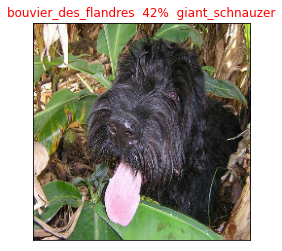

In [ ]:
plot_preds(prediction_probabilities=predictions,labels=val_labels,
           images=val_images,n=97)

Now we have got a function to visualise our models top predictions. Let's make another function to view our model top 10 prediction

This function will be able to do :
* Take input probability , val images& val_label ( To compare) and an integer
* sort the probability in descending order and compare on which it sets well
* Give us an output wth top ten levels and the image
      


In [ ]:
def top_ten(prediction_probabilities,label,n=1):
  """
  Plots top 10 prediction confidence along with truth label for nth sample
  """
  pred_prob=prediction_probabilities[n]
  true_label=label[n]
  # Get the predicted label
  pred_label =get_pred_label(pred_prob)

  # Find the top 10 prediction indexes
  Top_Ten_Index=pred_prob.argsort()[-10:][::-1]
  # Find the top ten predicted confidence value
  top_ten_pred_values=pred_prob[Top_Ten_Index]
  top_pred_labels=unique_breeds[Top_Ten_Index]

  #Set a plot
  top_plot=plt.bar(np.arange(len(top_pred_labels)),
                   top_ten_pred_values,
                   color="grey")
  plt.xticks(np.arange(len(top_pred_labels)),
                       labels=top_pred_labels,
             rotation="vertical")
  # Change the colour of 
  if np.isin(true_label,top_pred_labels):
    top_plot[np.argmax(top_pred_labels ==true_label)].set_color("green")
    
  else:
    pass  

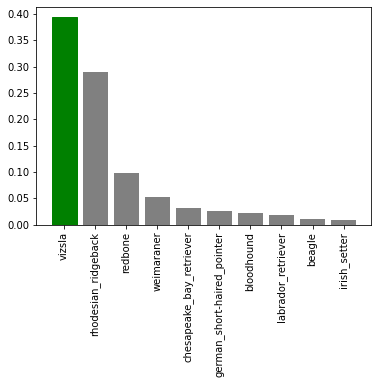

In [ ]:
top_ten(predictions,val_labels,n=1)

### Saving and loading a model

# Create a function to save a model

In [ ]:
def save_model(model, suffix = None):
  """
  Saves a given model in a models directory and appends a suffix(string).
  """
  modeldir = os.path.join("/content/drive/MyDrive/my_model",
                          datetime.datetime.now().strftime("%Y%m%d--%H%M%s"))
  model_path = modeldir + "-"+ suffix + ".h5" 
  print(f" Saving model to : {model_path}--")
  model.save(model_path)
  return model_path


In [ ]:
# Loading a model
def model_load(model_path):
  """
  Loads a model from specific parts
  """
  print(f"Loading save model from {model_path}")
  model = tf.keras.models.load_model(model_path, custom_objects={"KerasLayer": hub.KerasLayer})
  return model

In [ ]:
# save our model trained on 100 mages
save_model(model,suffix = "100-images-v2")

 Saving model to : /content/drive/MyDrive/my_model/20220809--17101660065042-100-images-v2.h5--


'/content/drive/MyDrive/my_model/20220809--17101660065042-100-images-v2.h5'

In [ ]:
## Load the trained model
loaded_1000_images_model = model_load("/content/drive/MyDrive/my_model/20220809--17101660065042-100-images-v2.h5")

Loading save model from /content/drive/MyDrive/my_model/20220809--17101660065042-100-images-v2.h5


In [ ]:
if model.summary() == loaded_1000_images_model.summary():
  print("True")
else:
  print("False")  

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_1 (KerasLayer)  (None, 1001)              5432713   
                                                                 
 dense_1 (Dense)             (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________
Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_1 (KerasLayer)  (None, 1001)              5432713   
                                                                 
 dense_1 (Dense)             (None, 120)               120240    
                                                                 
Total params: 5,

## Training the dog model(1000 images)

In [ ]:
len(x),len(y)

(10222, 10222)

In [ ]:
x[:5]

['/content/drive/MyDrive/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/train/0021f9ceb3235effd7fcde7f7538ed62.jpg']

In [ ]:
len(x_train)

800

In [ ]:
unique_breeds[np.argmax(y[0])]

'boston_bull'

In [ ]:
## create a dat batch with full data set
full_data = create_data_batches(x,y)

Creating Batches for train_data


In [ ]:
full_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
#create a model
full_model = create_model()

 Building model with url https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [ ]:
# Create full model call backs
full_model_callBacks = create_tensorboard_callback()
# No validation when we are training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience = 3)

**Note:** Running below cell might take a hell lot of time  as it will load all the images to the GPU

In [ ]:
%%time
# Fit the full model to the full Data
full_model.fit(x=full_data,epochs=NUM_EPOCHS,
               callbacks = [full_model_callBacks, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 47s 125ms/step - loss: 1.3388 - accuracy: 0.6690
Epoch 2/100
320/320 [==============================] - 37s 116ms/step - loss: 0.4023 - accuracy: 0.8824
Epoch 3/100
320/320 [==============================] - 41s 127ms/step - loss: 0.2331 - accuracy: 0.9369
Epoch 4/100
320/320 [==============================] - 41s 127ms/step - loss: 0.1563 - accuracy: 0.9609
Epoch 5/100
320/320 [==============================] - 40s 125ms/step - loss: 0.1060 - accuracy: 0.9782
Epoch 6/100
320/320 [==============================] - 39s 123ms/step - loss: 0.0779 - accuracy: 0.9859
Epoch 7/100
320/320 [==============================] - 41s 129ms/step - loss: 0.0577 - accuracy: 0.9915
Epoch 8/100
320/320 [==============================] - 41s 127ms/step - loss: 0.0448 - accuracy: 0.9938
Epoch 9/100
320/320 [==============================] - 40s 125ms/step - loss: 0.0369 - accuracy: 0.9956
Epoch 10/100
320/320 [==============================] - 42s 132m

In [ ]:
save_model(full_model,suffix="Full-image-set-V2")

 Saving model to : /content/drive/MyDrive/my_model/20220809--18331660070007-Full-image-set-V2.h5--


'/content/drive/MyDrive/my_model/20220809--18331660070007-Full-image-set-V2.h5'

In [ ]:
loaded_full_model = model_load("/content/drive/MyDrive/my_model/20220809--18331660070007-Full-image-set-V2.h5")

Loading save model from /content/drive/MyDrive/my_model/20220809--18331660070007-Full-image-set-V2.h5


### Make prediction on the Data sets
Since our model is trained ina specific batches we have to transform our test set to batches before using

To make predictions on the test dataset, we wil do the following steps:
* Get the test images filenames
* Convert the filenames into test data Batches using `create_data_batches()` and setting the the test data parameter to `True` (since ) the test data dosen't have labels
* Make predictions array by passing the test batches to the `predict()` method called on our model

In [23]:
# Load test images filenames
test_path = "/content/drive/MyDrive/test/"
test_filenames = [ test_path + fname for fname in os.listdir(test_path)]
test_filenames[:5]

['/content/drive/MyDrive/test/def639bab46dfc714234180be730ef49.jpg',
 '/content/drive/MyDrive/test/e4c37f2fbeabc98e168ebf4abce59370.jpg',
 '/content/drive/MyDrive/test/dcccc266ef919edbf3416078edc849db.jpg',
 '/content/drive/MyDrive/test/e119301e11d4f1620948c3e6f5a3f021.jpg',
 '/content/drive/MyDrive/test/e699b20911a55abda3558c5bcd37443d.jpg']

In [ ]:
##creating test data batches
test_data = create_data_batches(test_filenames,test_data=True)

Creating Batches for test_data


In [ ]:
test_data

<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
## make prediction on the test data batches using loaded full model using the data
test_predictions = loaded_full_model.predict(test_data,verbose=1)

324/324 [==============================] - 1933s 6s/step


In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Save predictions (Numpy array) from csv file
np.savetxt("/content/drive/MyDrive/pred.csv", test_predictions, delimiter=",")

In [3]:
import numpy as np
test_predictions = np.loadtxt("/content/drive/MyDrive/pred.csv",delimiter=",")

In [20]:
for i in range(20):
  print(f"{unique_breeds[np.argmax(test_predictions[i])]}")

schipperke
irish_wolfhound
border_collie
lakeland_terrier
labrador_retriever
dandie_dinmont
miniature_schnauzer
english_foxhound
sealyham_terrier
appenzeller
irish_wolfhound
toy_terrier
irish_terrier
cocker_spaniel
scottish_deerhound
old_english_sheepdog
tibetan_terrier
giant_schnauzer
miniature_pinscher
cairn


## Preparing test dataset predictons for kaggle
To get the in the format Kaggle wants is :
* Create a pandas data Frame and ID column as well as a column for each dog breed
* Add data to the ID columns by extracting the test image ID's from their file paths
* Add data( prediction probabilities)
* Export the dataFrame as a CSV format

In [21]:
# Create a pandas DataFrame
import pandas as pd
preds_df = pd.DataFrame(columns =["id"] + list(unique_breeds))
preds_df[:1]

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [24]:
test_filenames[:2]

['/content/drive/MyDrive/test/def639bab46dfc714234180be730ef49.jpg',
 '/content/drive/MyDrive/test/e4c37f2fbeabc98e168ebf4abce59370.jpg']

In [25]:
test_path

'/content/drive/MyDrive/test/'

In [31]:
# Append test Image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]

In [27]:
os.path.splitext(test_filenames[3])

('/content/drive/MyDrive/test/e119301e11d4f1620948c3e6f5a3f021', '.jpg')

In [29]:
type(test_filenames[1])

str

In [30]:
test_filenames[1][:-4]

'/content/drive/MyDrive/test/e4c37f2fbeabc98e168ebf4abce59370'

In [32]:
test_ids

['def639bab46dfc714234180be730ef49',
 'e4c37f2fbeabc98e168ebf4abce59370',
 'dcccc266ef919edbf3416078edc849db',
 'e119301e11d4f1620948c3e6f5a3f021',
 'e699b20911a55abda3558c5bcd37443d',
 'e334f758c7944df19c98d49498d28c64',
 'de59703200e1b19b520033e76dea9b62',
 'e715c53e3d189a20760ef4d891a865dc',
 'e3f04efb648b110b2eb04b9c041504d8',
 'e5f2204119380ce1a17fd09435c5012a',
 'de084b830010b6107215fef5d4a75b94',
 'eb8d19898e69b355679f98fe068cb06a',
 'eb9d126d7a3adc19f25e4c9ba79aa6ce',
 'e850770a6575a34b1c7ad4b401692553',
 'efdf443fb4a6ad5964c18d6676f36652',
 'e9574ebd4785c1e1a1470dfc93f9271e',
 'f31ffe7d14c530955f2d4c78b93f80eb',
 'f14547a7bed40d4170bc70eafd1eb5e7',
 'efd7266343c00fd2cb3cf5aec4aa0b42',
 'ecb31808b1717c297072d6f5b8760c2f',
 'ec8bf9fd1bae9c6cc54b996425538a5c',
 'ede76874678b483c87bfe1db25f78f9b',
 'f16f47570b2ef2c21c54eb1478518e8f',
 'f31bfb17e3d1800493376fffd77fed72',
 'ebe4a8b8507fa28905cb7e70b90b9170',
 'ebaafedb1a8a61e8d3f9eaa271b27629',
 'edd77b60eb22df1021e726b87c270064',
 

In [33]:
preds_df["id"] = test_ids
preds_df

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,def639bab46dfc714234180be730ef49,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e4c37f2fbeabc98e168ebf4abce59370,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,dcccc266ef919edbf3416078edc849db,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e119301e11d4f1620948c3e6f5a3f021,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e699b20911a55abda3558c5bcd37443d,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10352,08699bdbc18bde158cdc4969b6c51d81,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10353,08db8163ff5451ae44b7496b5c9ee05a,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10354,08f4ff17cc6bf754d798eb3b39fafebe,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10355,08b34271d7d196d13bbeeea99504e099,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [34]:
## Add the predictions probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions

In [35]:
preds_df

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,def639bab46dfc714234180be730ef49,4.526257e-08,3.597805e-10,1.915915e-10,3.800737e-13,4.172009e-09,3.429700e-09,9.356386e-08,1.880787e-09,3.448614e-11,...,6.974513e-08,7.947784e-08,8.027546e-10,1.963898e-10,3.141634e-08,8.752662e-14,3.308566e-10,2.464044e-08,1.881876e-11,2.589335e-07
1,e4c37f2fbeabc98e168ebf4abce59370,5.087142e-08,2.857097e-08,1.206731e-08,1.860551e-10,2.571489e-10,2.329423e-08,7.616496e-09,3.351558e-10,2.797157e-09,...,1.256398e-11,1.351362e-08,1.234855e-09,5.443586e-09,1.203013e-08,1.348837e-10,3.854357e-03,1.662503e-06,5.365292e-07,2.794112e-09
2,dcccc266ef919edbf3416078edc849db,4.270256e-10,6.101711e-10,1.585234e-10,4.842992e-09,4.324629e-08,5.240435e-05,2.553040e-10,6.149771e-09,2.360592e-09,...,3.526681e-10,1.118523e-11,3.113950e-09,7.745005e-08,3.860512e-10,1.250379e-10,1.056260e-08,2.547010e-09,4.037270e-11,2.765009e-11
3,e119301e11d4f1620948c3e6f5a3f021,1.109613e-07,3.945408e-11,6.359895e-10,1.869038e-02,1.338166e-06,4.043389e-10,2.235952e-09,1.044105e-08,1.426876e-11,...,1.372700e-04,4.178641e-08,5.530157e-07,5.000567e-08,1.163290e-08,2.739786e-09,1.121149e-09,7.986629e-09,3.225149e-07,1.338639e-05
4,e699b20911a55abda3558c5bcd37443d,2.668946e-10,2.328613e-09,4.140739e-09,6.199125e-09,1.204413e-05,1.451535e-10,3.347011e-07,6.752661e-07,4.836068e-09,...,6.819490e-06,2.202246e-07,7.278241e-08,1.508904e-03,7.066481e-06,1.719888e-10,3.324346e-10,6.548481e-07,1.016440e-06,7.635066e-09
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10352,08699bdbc18bde158cdc4969b6c51d81,5.720070e-12,1.214469e-13,5.619122e-13,9.678667e-13,9.955407e-11,2.225177e-11,3.099919e-10,6.860841e-11,1.623584e-14,...,1.305016e-11,7.111192e-13,5.932157e-13,6.226210e-13,1.540332e-12,2.917166e-12,3.740400e-14,7.740740e-17,1.020655e-13,4.895867e-11
10353,08db8163ff5451ae44b7496b5c9ee05a,5.872477e-11,2.790087e-11,3.419631e-13,1.630657e-06,7.220484e-08,2.545104e-10,4.285188e-09,3.250423e-10,4.064899e-11,...,4.834672e-10,9.002906e-07,1.066321e-10,1.440923e-10,4.554916e-13,2.110556e-11,3.238575e-12,2.541195e-06,1.473938e-09,1.749214e-08
10354,08f4ff17cc6bf754d798eb3b39fafebe,4.994629e-10,2.116628e-09,2.298911e-08,3.197879e-10,1.010867e-09,2.170734e-10,2.580093e-10,4.856963e-09,6.590621e-10,...,1.766630e-10,3.781804e-10,3.365000e-09,9.660320e-11,4.061402e-10,9.298140e-12,2.779219e-10,2.590610e-11,1.289795e-10,1.215080e-09
10355,08b34271d7d196d13bbeeea99504e099,5.093535e-10,6.633802e-10,3.528920e-11,1.505733e-07,6.916787e-09,5.362611e-05,1.922144e-07,2.256593e-07,2.980504e-11,...,7.110945e-08,2.127002e-06,1.484158e-08,8.918336e-09,2.044116e-08,6.069064e-09,1.810503e-08,1.613208e-09,3.055971e-08,2.631646e-07


In [36]:
preds_df.to_csv("/content/drive/MyDrive/Dog_vision-MobileNetV2.csv",index =False)